# Visualize the filters.
Use Gradient Ascend to maximize the fitness of a given filter.

In [1]:
from keras.applications import VGG16
from keras import backend as K

model=VGG16(weights="imagenet",
           include_top=False)
model.summary()

Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

# Get the patterns generates by maximize the filter's fitness

In [3]:
import numpy as np
def process_img(img):
    img-=img.mean()
    img/=(img.std()+1e-5)
    img*=0.1
    
    #clip to [0,1]
    img+=0.5
    img=np.clip(img,0,1)
    
    #to RGB 
    img*=255
    img=np.clip(img,0,255).astype("uint8")
    return img
def generate_pattern(layer_name,filter_index,size=150):
    layer_output=model.get_layer(layer_name).output
    fitness=K.mean(layer_output[:,:,:,filter_index])
    
    grads=K.gradients(fitness,model.input)[0]
    #Normalization of grads:L2 norm
    grads/=(K.sqrt(K.mean(K.square(grads)))+1e-5)
    
    #iterate:given the input,return the fitness and grads
    iterate=K.function([model.input],[fitness,grads])
    
    input_img=np.random.random((1,size,size,3))*20+128.
    
    learning_step=1.
    for i in range(40):
        fit,grad=iterate([input_img])
        input_img+=learning_step*grad
    img=input_img[0]
    return process_img(img)

# Check for block4_conv1

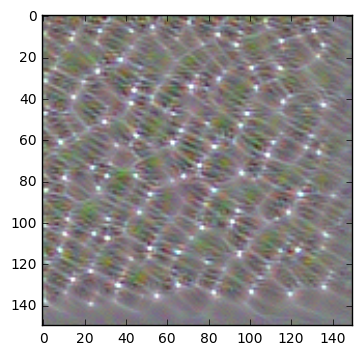

In [5]:
from matplotlib import pyplot as plt
%matplotlib inline
layer="block4_conv1"
index=8

pattern=generate_pattern(layer,index)
plt.imshow(pattern)


# Visualize a layer's filter

In [12]:

def display_layers(layer_name):
    size=64
    margin=3

    results=np.zeros((8*size+7*margin,8*size+7*margin,3))

    for i in range(8):
        for j in range(8):
            results[i*size+i*margin:(i+1)*size+i*margin,j*size+j*margin:(j+1)*size+j*margin,:]=generate_pattern(layer_name,i*8+j,size=size)
    plt.figure(figsize=(15,15))
    plt.imshow(results)

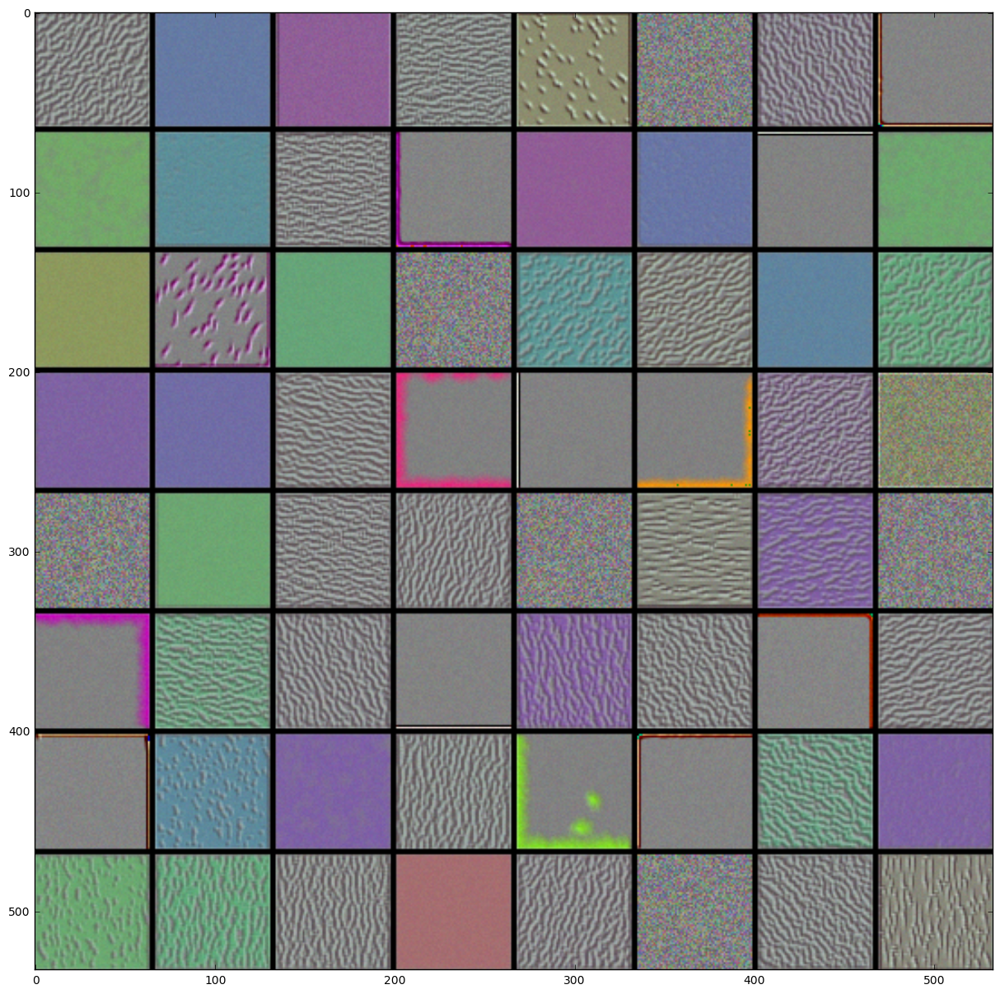

In [13]:
display_layers("block1_conv1")

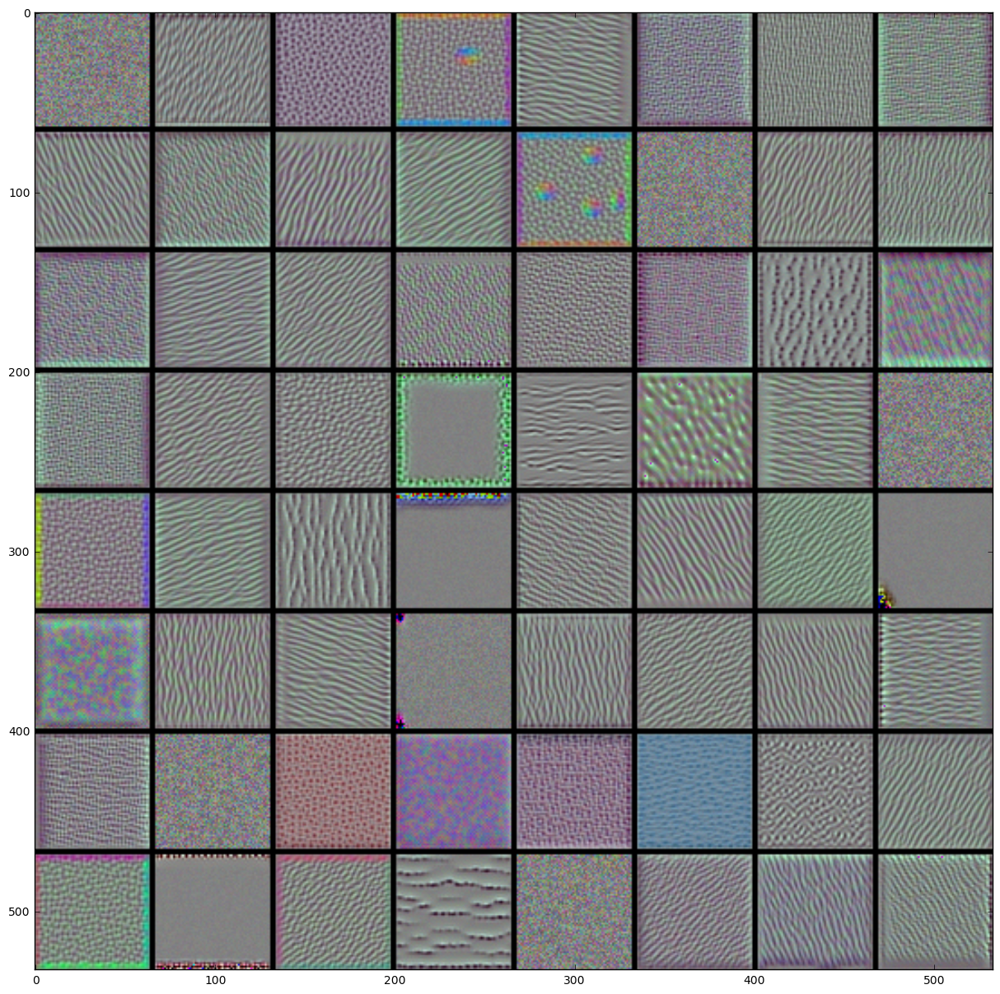

In [14]:
display_layers("block2_conv1")

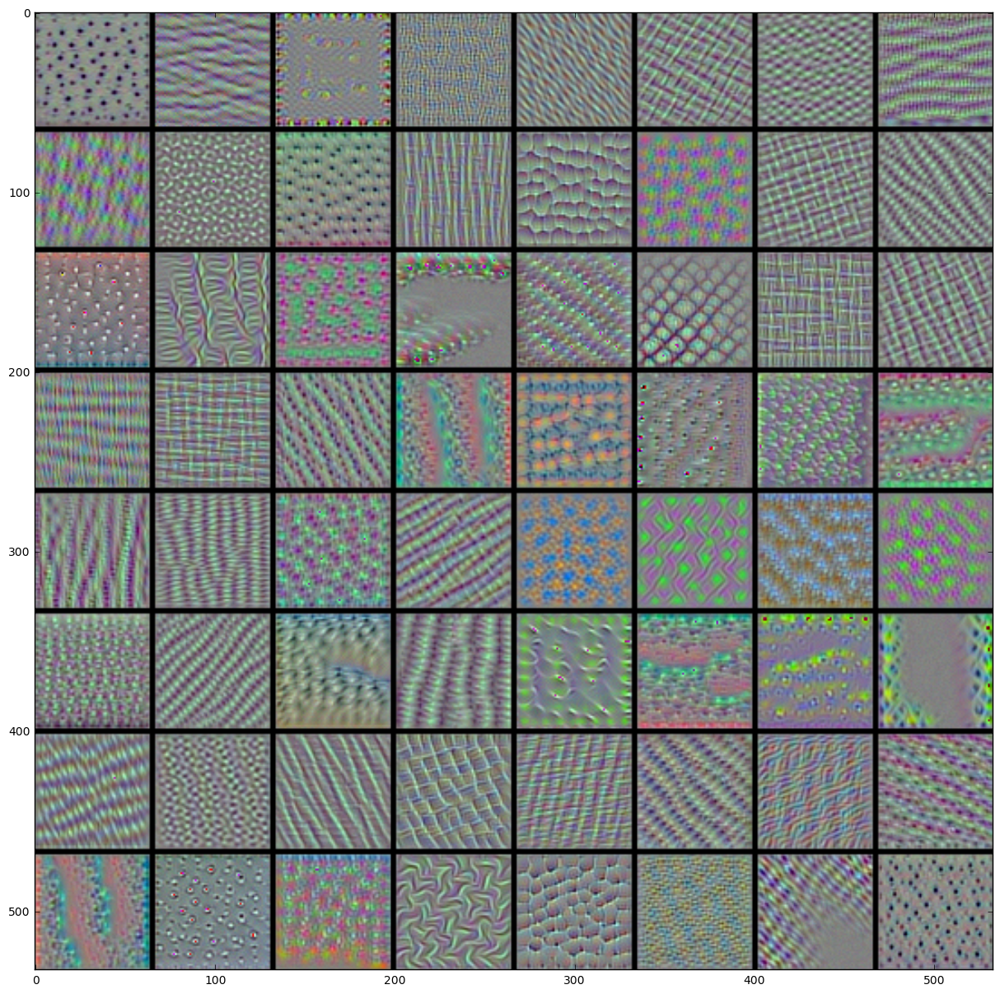

In [15]:
display_layers("block3_conv1")

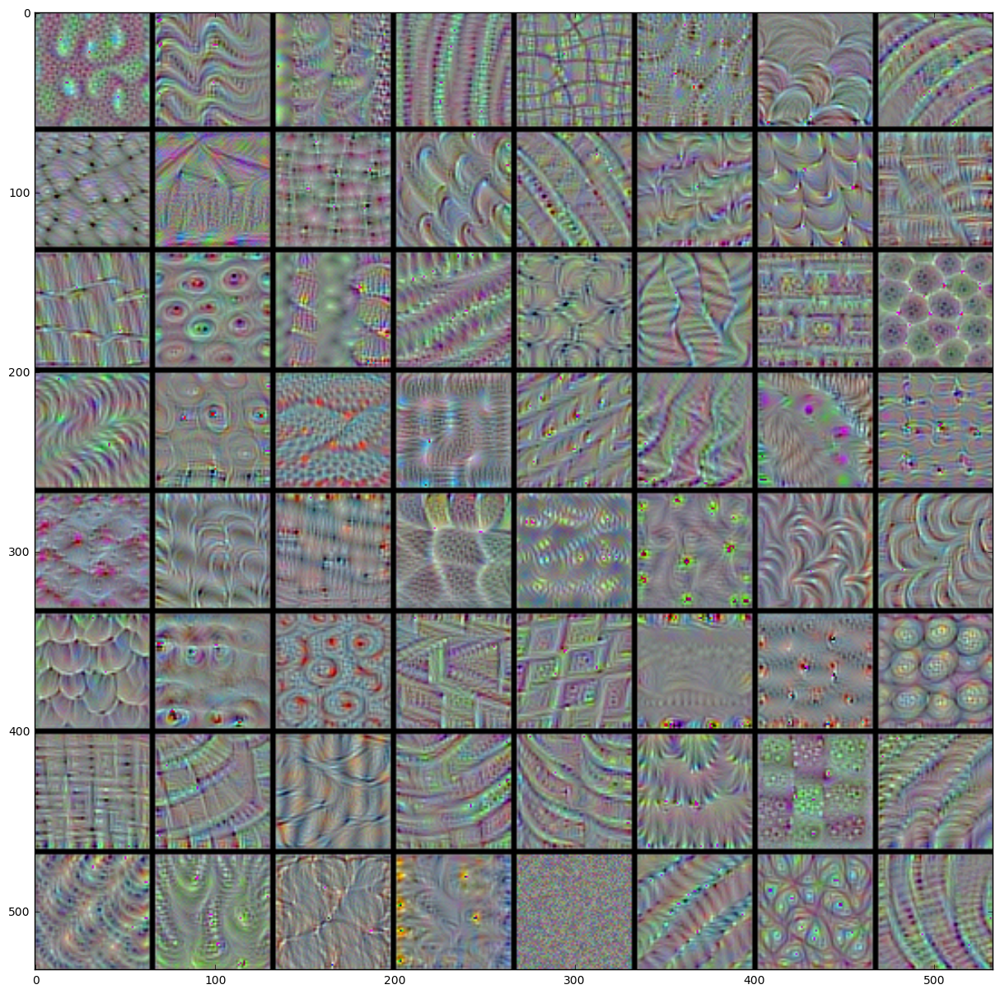

In [16]:
display_layers("block4_conv1")

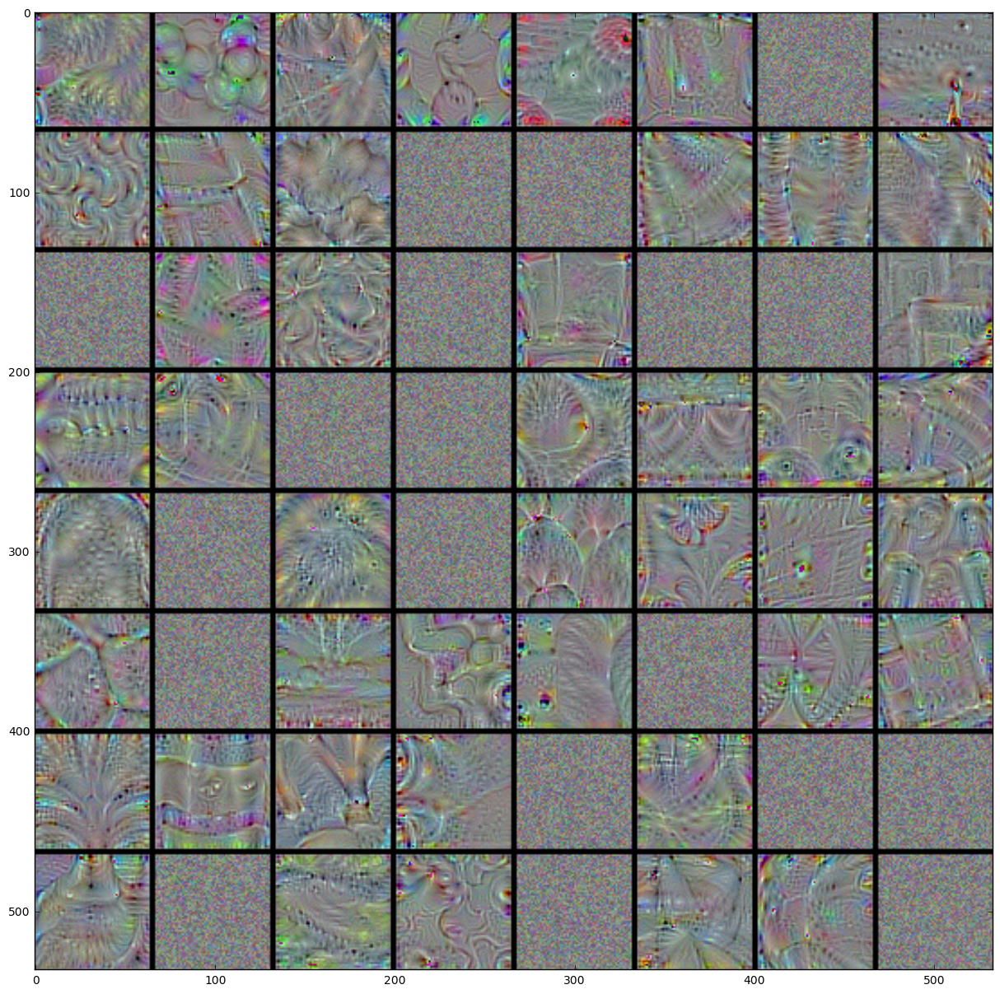

In [17]:
display_layers("block5_conv1")